In [ ]:
# Set up
import copy
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T
import torchvision.datasets as datasets
import time
from torch.utils.data import DataLoader

In [ ]:
from torch.utils.data import sampler

# Data augmentation and normalization for training 
# Just normalization for validation
data_transforms = {
    'train': T.Compose([
          T.RandomResizedCrop(224),
          T.ColorJitter(hue=.05, saturation=.05),
          T.RandomHorizontalFlip(),
          T.ToTensor(),
          T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ]),
    'val': T.Compose([
          T.Resize(256),
          T.CenterCrop(224),
          T.ToTensor(),
          T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ])
}

data_size = {
    'train': range(49000),
    'val': range(49000, 50000),
}

image_datasets = {x: datasets.CIFAR10('./cs231n/datasets', train=True, download=True,
                                      transform=data_transforms[x]) for x in ['train', 'val']
                  }
image_dataloaders = {x: DataLoader(image_datasets[x], batch_size=64, 
                                   sampler=sampler.SubsetRandomSampler(data_size[x]), num_workers=8) for x in ['train', 'val']
                     }
class_names = image_datasets['train'].classes
print(class_names)

device = ("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

Files already downloaded and verified
Files already downloaded and verified
['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
cuda:0


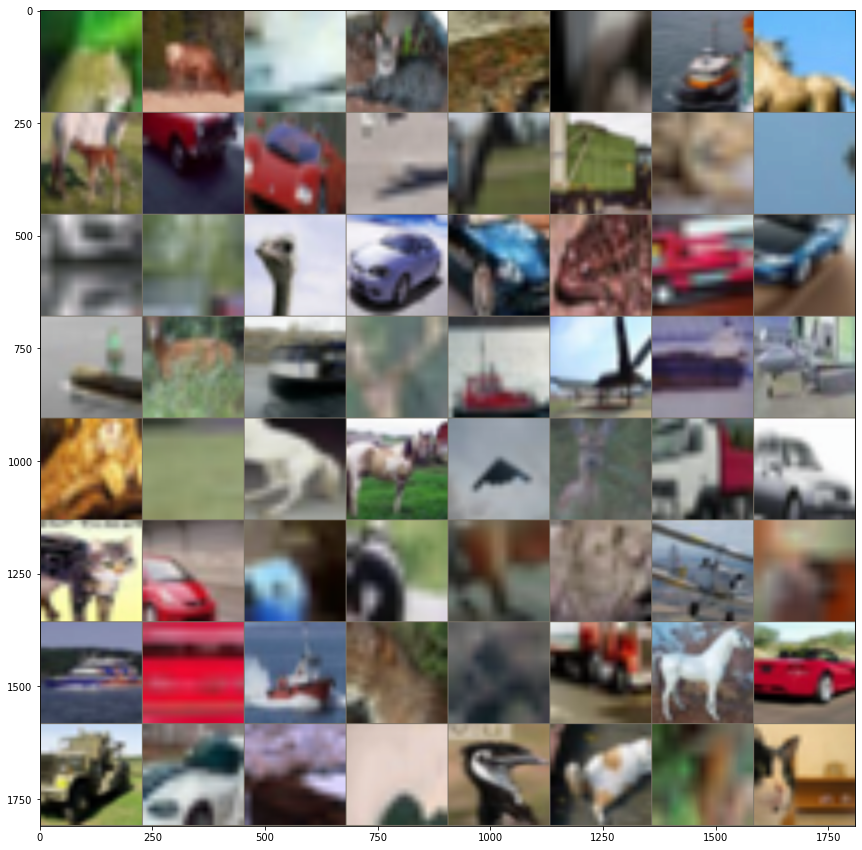

In [ ]:
def imshow(inp, title=None, ax=None, figsize=(5, 5)):
  """Imshow for Tensor."""
  inp = inp.numpy().transpose((1, 2, 0))
  mean = np.array([0.485, 0.456, 0.406])
  std = np.array([0.229, 0.224, 0.225])
  inp = std * inp + mean
  inp = np.clip(inp, 0, 1)
  if ax is None:
    fig, ax = plt.subplots(1, figsize=figsize)
  ax.imshow(inp)

# Get a batch of training data
inputs, classes = next(iter(image_dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs, nrow=8)

fig, ax = plt.subplots(1, figsize=(15, 15))
imshow(out, ax=ax)

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs, device):
  """
  Support function for model training.

  Args:
    model: Model to be trained
    criterion: Optimization criterion (loss)
    optimizer: Optimizer to use for training
    scheduler: Instance of ``torch.optim.lr_scheduler``
    num_epochs: Number of epochs
    device: Device to run the training on. Must be 'cpu' or 'cuda'
  """
  since = time.time()

  # Keep track of the best_model and the best validation accuracy
  best_model = copy.deepcopy(model.state_dict())
  best_val = -1

  for epoch in range(num_epochs):
    print('Epoch {}/{}'.format(epoch, num_epochs - 1))
    print('-' * 10)

    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
      if phase == 'train':
        model.train()  # Set model to training mode
      else:
        model.eval()  # Set model to evaluation mode
      
      # Keeping track of the loss of one epoch and the number 
      # of correctly labeled images.
      running_loss = 0.0
      running_corrects = 0

      # Iterate over data
      for i, (x, y) in enumerate(image_dataloaders[phase]):
        x, y = x.to(device), y.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        # Track history only in the training phase.
        with torch.set_grad_enabled(phase == 'train'):
          scores = model(x)
          loss = criterion(scores, y)
          _, preds = scores.max(1)
          
          # Backward pass -- Only in the training phase
          if phase == 'train':
            loss.backward()
            optimizer.step()
        
        running_loss += loss * x.size(0)
        running_corrects += (preds == y).sum()

      # If training, activate the learning rate scheduler
      if phase == 'train':
        scheduler.step()

      epoch_loss = running_loss / len(data_size[phase])
      epoch_acc = running_corrects.double() / len(data_size[phase])

      print('{} Loss: {:.4f} Acc: {:.4f}'.format(
            phase, epoch_loss, epoch_acc))
      
      # Writing the epoch info to tensorboard
      writer.add_scalar('Loss/'+phase, epoch_loss, global_step=epoch)
      writer.add_scalar('Acc/'+phase, epoch_acc, global_step=epoch)
      
      if phase == 'val' and epoch_acc > best_val:
        best_val = epoch_acc
        best_model = copy.deepcopy(model.state_dict())
    
      print()

  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
  print('Best val Acc: {:4f}'.format(best_val))

  # Load the best model parameters
  model.load_state_dict(best_model)
  return model

In [ ]:
def visualize_model(model, device, rows=3, cols=3):
  """
  Displays predictions for a few images
  """
  was_training = model.training
  model.eval()
  current_row = current_col = 0
  fig, ax = plt.subplots(rows, cols, figsize=(cols*2, rows*2))

  with torch.no_grad():
    for idx, (imgs, lbls) in enumerate(image_dataloaders['val']):
      imgs = imgs.to(device)
      lbls = lbls.to(device)

      outputs = model(imgs)
      _, preds = torch.max(outputs, 1)

      for jdx in range(imgs.size(0)):
        imshow(imgs.data.cpu()[jdx], ax=ax[current_row, current_col])
        ax[current_row, current_col].axis('off')
        ax[current_row, current_col].set_title('predicted: {}'.format(class_names[preds.cpu()[jdx]]))

        current_col += 1
        if current_col >= cols:
          current_row += 1
          current_col = 0
        if current_row >= rows:
          model.train(mode=was_training)
          return
    model.train(mode=was_training)

In [ ]:
# Building TensorBoard to display the Loss vs. Epoch and Acc vs. Epoch
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter('log1')

In [ ]:
# Fine-Tuning All Network
resnet18_ft = torchvision.models.resnet18(pretrained=True, progress=True)
num_features = resnet18_ft.fc.in_features

resnet18_ft.fc = nn.Linear(num_features, 10) # There are 10 classes in CIFAR10 dataset
criterion = nn.CrossEntropyLoss()

# Using GPU
resnet18_ft = resnet18_ft.to(device)

# A low learning rate is used for finetuning as the pretrained weights shouldn't
# be changed drastically. Also the whole network is being finetuned as all parameters 
# of the network are passed to the optimizer object.
optimizer_ft = optim.SGD(resnet18_ft.parameters(), lr=1e-3, momentum=0.9, weight_decay=1e-4) 

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

new_model_ft = train_model(resnet18_ft, criterion, optimizer_ft, exp_lr_scheduler,
                        num_epochs=10, device=device)

Epoch 0/9
----------
train Loss: 1.0036 Acc: 0.6523

val Loss: 0.3590 Acc: 0.8780

Epoch 1/9
----------
train Loss: 0.6548 Acc: 0.7731

val Loss: 0.2446 Acc: 0.9190

Epoch 2/9
----------
train Loss: 0.5738 Acc: 0.8008

val Loss: 0.2205 Acc: 0.9190

Epoch 3/9
----------
train Loss: 0.5417 Acc: 0.8129

val Loss: 0.1987 Acc: 0.9300

Epoch 4/9
----------
train Loss: 0.5078 Acc: 0.8251

val Loss: 0.1788 Acc: 0.9410

Epoch 5/9
----------
train Loss: 0.4831 Acc: 0.8334

val Loss: 0.1625 Acc: 0.9420

Epoch 6/9
----------
train Loss: 0.4672 Acc: 0.8381

val Loss: 0.1660 Acc: 0.9450

Epoch 7/9
----------
train Loss: 0.4333 Acc: 0.8488

val Loss: 0.1485 Acc: 0.9470

Epoch 8/9
----------
train Loss: 0.4174 Acc: 0.8550

val Loss: 0.1559 Acc: 0.9440

Epoch 9/9
----------
train Loss: 0.4179 Acc: 0.8547

val Loss: 0.1467 Acc: 0.9470

Training complete in 50m 6s
Best val Acc: 0.947000


In [ ]:
%load_ext tensorboard
%tensorboard --logdir log1

Output hidden; open in https://colab.research.google.com to view.

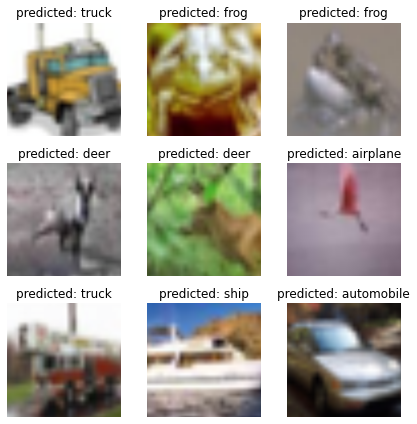

In [ ]:
# Visualizing some predictions after fine-tuning on CIFAR10
visualize_model(new_model_ft, device=device)
plt.tight_layout()

In [ ]:
writer = SummaryWriter('log2')

In [ ]:
# Feature Extractor (CNN Codes)
resnet18_fe = torchvision.models.resnet18(pretrained=True, progress=True)
num_features = resnet18_fe.fc.in_features
resnet18_fe.fc = nn.Linear(num_features, 10) # There are 10 classes in CIFAR10 dataset

# Using GPU
resnet18_fe = resnet18_fe.to(device)

# Freezing the parameters of all layers to get CNN codes of 4096-D vectors
# And Unfreezing the weight of the newly added classifier.
for param in resnet18_fe.parameters():
    param.requires_grad = False

resnet18_fe.fc.weight.requires_grad = True
resnet18_fe.fc.bias.requires_grad = True

# Same set-up as finetuning section except for the learning rate
# Learning rate can be set to yet again 0.01 because we are training
# only the last linear classifier. 
resnet18_fe = resnet18_fe.to(device)
optimizer_ft = optim.SGD(resnet18_fe.parameters(), lr=1e-2, momentum=0.9, weight_decay=1e-4) 
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)
criterion = nn.CrossEntropyLoss()

new_model_ft = train_model(resnet18_fe, criterion, optimizer_ft, exp_lr_scheduler,
                        num_epochs=10, device=device)

Epoch 0/9
----------
train Loss: 1.3551 Acc: 0.5308

val Loss: 0.9450 Acc: 0.6910

Epoch 1/9
----------
train Loss: 1.2823 Acc: 0.5636

val Loss: 0.8237 Acc: 0.7250

Epoch 2/9
----------
train Loss: 1.2655 Acc: 0.5691

val Loss: 0.7461 Acc: 0.7510

Epoch 3/9
----------
train Loss: 1.2754 Acc: 0.5674

val Loss: 1.0189 Acc: 0.6510

Epoch 4/9
----------
train Loss: 1.2700 Acc: 0.5688

val Loss: 0.9167 Acc: 0.6990

Epoch 5/9
----------
train Loss: 1.2632 Acc: 0.5715

val Loss: 0.8786 Acc: 0.6830

Epoch 6/9
----------
train Loss: 1.2601 Acc: 0.5703

val Loss: 0.9737 Acc: 0.6720

Epoch 7/9
----------
train Loss: 1.1410 Acc: 0.6044

val Loss: 0.7362 Acc: 0.7460

Epoch 8/9
----------
train Loss: 1.1218 Acc: 0.6087

val Loss: 0.7286 Acc: 0.7580

Epoch 9/9
----------
train Loss: 1.1308 Acc: 0.6039

val Loss: 0.7322 Acc: 0.7540

Training complete in 43m 28s
Best val Acc: 0.758000


In [ ]:
%load_ext tensorboard
%tensorboard --logdir log2

Output hidden; open in https://colab.research.google.com to view.

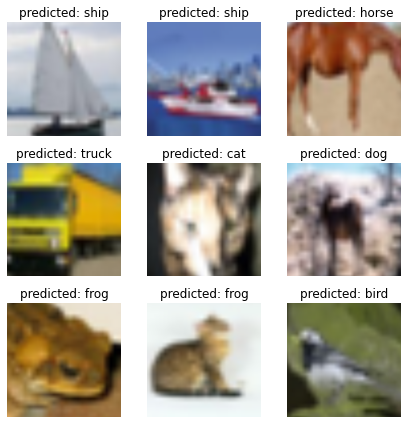

In [ ]:
# Visualizing some predictions after fine-tuning on CIFAR10
visualize_model(new_model_ft, device=device)
plt.tight_layout()

In [ ]:
writer = SummaryWriter('log3')

In [ ]:
# Trying to train from scratch (not pretrained weights)
resnet18 = torchvision.models.resnet18(pretrained=False, progress=True)
num_features = resnet18.fc.in_features

resnet18.fc = nn.Linear(num_features, 10) # There are 10 classes in CIFAR10 dataset
criterion = nn.CrossEntropyLoss()

# Using GPU
resnet18 = resnet18.to(device)

# Same set-up as finetuning section except for the learning rate
# Learning rate can be set to yet again 0.01 because we are training
# from scratch 
optimizer_ft = optim.SGD(resnet18.parameters(), lr=1e-2, momentum=0.9, weight_decay=1e-4) 

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = optim.lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

new_model_ft = train_model(resnet18, criterion, optimizer_ft, exp_lr_scheduler,
                        num_epochs=20, device=device)

Epoch 0/19
----------
train Loss: 1.8172 Acc: 0.3361

val Loss: 1.4399 Acc: 0.4870

Epoch 1/19
----------
train Loss: 1.4886 Acc: 0.4651

val Loss: 1.0889 Acc: 0.6140

Epoch 2/19
----------
train Loss: 1.2735 Acc: 0.5483

val Loss: 1.2897 Acc: 0.5880

Epoch 3/19
----------
train Loss: 1.1489 Acc: 0.5943

val Loss: 0.7680 Acc: 0.7520

Epoch 4/19
----------
train Loss: 1.0566 Acc: 0.6307

val Loss: 0.6880 Acc: 0.7550

Epoch 5/19
----------
train Loss: 0.9887 Acc: 0.6519

val Loss: 0.7963 Acc: 0.7210

Epoch 6/19
----------
train Loss: 0.9438 Acc: 0.6690

val Loss: 0.6405 Acc: 0.7860

Epoch 7/19
----------
train Loss: 0.8037 Acc: 0.7191

val Loss: 0.4767 Acc: 0.8340

Epoch 8/19
----------
train Loss: 0.7736 Acc: 0.7314

val Loss: 0.4587 Acc: 0.8460

Epoch 9/19
----------
train Loss: 0.7530 Acc: 0.7368

val Loss: 0.4359 Acc: 0.8530

Epoch 10/19
----------
train Loss: 0.7413 Acc: 0.7426

val Loss: 0.4318 Acc: 0.8480

Epoch 11/19
----------
train Loss: 0.7424 Acc: 0.7426

val Loss: 0.4295 Acc

In [ ]:
%load_ext tensorboard
%tensorboard --logdir log3

Output hidden; open in https://colab.research.google.com to view.

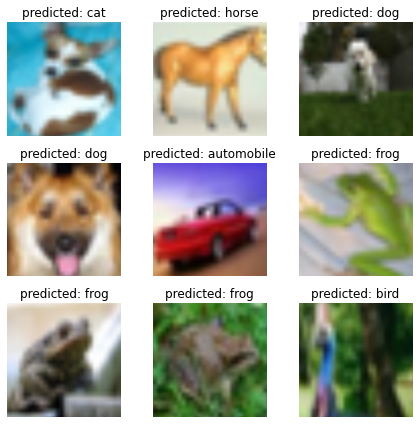

In [ ]:
# Visualizing some predictions after fine-tuning on CIFAR10
visualize_model(new_model_ft, device=device)
plt.tight_layout()